# Tarea 2: Cálculo de puntos de interés y alineamiento de imágenes

**Ignacio Zurita Tapia**

# Introducción

En el presente documento se presenta tanto el desarrollo, como los resultados obtenidos durante el desarrollo de la segunda tarea del curso EL7008. En esta, se implementan y analizan los detectores de puntos de interés de Harris y Shi-tomasi, además de la correspondencia entre imágenes utilizando descriptores para finalmente alinear imágenes.

A continuación, se listan las secciones principales del informe:

- Marco Teórico: en esta sección se da una breve explicación de los algoritmos principales, tales como los detectores de Harris y Shi-tomasi, la correspondencia usando descriptores y la transformación de homografía.
- Cálculo de puntos de interés
- Alineamiento de imágenes

# Marco teórico

## **Detector de Harris**
El detector de Harris, sirve para detectar puntos de interés, los cuales en este caso corresponden a esquinas. Estos puntos pueden servir para describir la imágen en cierto modo, lo cual tiene aplicaciones en el área de visión computacional.

Su funcionamiento, se basa en tomar ventanas gaussianas a través de la imagen para determinar los puntos de interés. Si consideramos una imagen I de dos dimensiones, y una ventana W, podemos tomar el cuadrado de la resta entre los puntos de la imagen que están dentro de la ventana y los puntos que se desplazan en ($\Delta x, \Delta y$) de la ventana. La suma del cuadrado de las diferencias de todos estos puntos se puede expresar como :

$$ f(\Delta x,\Delta y)={\underset {(x_{k},y_{k})\in W}{\sum }}\left(I(x_{k},y_{k})-I(x_{k}+\Delta x,y_{k}+\Delta y)\right)^{2}$$

Adicionalmente, el término $I(x_{k}+\Delta x,y_{k}+\Delta y)$, se puede expandir por serie de Taylor:

$$I(x_{k}+\Delta x,y_{k}+\Delta y) \approx I(x_k,y_k)+I_{x}(x_k,y_k)\Delta x+I_{y}(x_k,y_k)\Delta y  $$

donde I_x e I_y, representan las derivadas en el eje x e y de la imagen, respectivamente.
Así, la expresión original se puede aproximar como:

$$ f(\Delta x,\Delta y)\approx {\underset {(x,y)\in W}{\sum }}\left(I_{x}(x,y)\Delta x+I_{y}(x,y)\Delta y\right)^{2} $$

En forma matricial 

$$ f(\Delta x,\Delta y)\approx {\begin{pmatrix}\Delta x  & \Delta y\end{pmatrix}}M{\begin{pmatrix}\Delta x\\\Delta y\end{pmatrix}} $$

donde M es el tensor estructura:

$$ M={\underset {(x,y)\in W}{\sum }}{\begin{bmatrix}m_{xx}& m_{xy}\\m_{xy}& m_{yy}\end{bmatrix}}={\begin{bmatrix}{\underset {(x,y)\in W}{\sum }}I_{x}^{2}& {\underset {(x,y)\in W}{\sum }}I_{x}I_{y}\\{\underset {(x,y)\in W}{\sum }}I_{x}I_{y}& {\underset {(x,y)\in W}{\sum }}I_{y}^{2}\end{bmatrix}}$$

En base a lo anterior, la respuesta del filtro de Harris puede calcularse como:

$$ 𝑐𝑜𝑟𝑛𝑒𝑟𝑛𝑒𝑠𝑠_{ℎ𝑎𝑟𝑟𝑖𝑠} = \lambda_1 ∗ \lambda_2 − k \cdot (\lambda_1 + \lambda_2)^2 $$

con $\lambda_1$ y $\lambda_2$ los valores propios de la matriz M y k un factor que normalmente está entre 0,04 y 0,06.

Esto es equivalente a 

$$ 𝑐𝑜𝑟𝑛𝑒𝑟𝑛𝑒𝑠𝑠_{ℎ𝑎𝑟𝑟𝑖𝑠} = det(M) − k \cdot (tr(M))^2 $$

Fuente: [Wikipedia](https://en.wikipedia.org/wiki/Harris_Corner_Detector)

## **Detector de Shi-tomasi**

El detector de Shi-tomasi es análogo al de Harris, salvo que, la respuesta del filtro se calcula como:

$$𝑐𝑜𝑟𝑛𝑒𝑟𝑛𝑒𝑠𝑠_{shi-tomasi} = \frac{tr(M)}{2}-\frac{\sqrt{tr(M)^2 - 4\cdot  det(M)}}{2}$$


## **Correspondencias usando descriptores**

A partir de puntos de interés en imágenes, una práctica común es calcular vectores de características que describen a tales puntos. Estos comunmente se denominan descriptores y existe una variedad de métodos para computarlos (como por ejemplo [SURF](https://es.wikipedia.org/wiki/SURF), [SIFT](https://es.wikipedia.org/wiki/Scale-invariant_feature_transform)).

Estos descriptores de imágenes, pueden servir para diferentes tareas en el ambito de visión computacional, como por ejemplo Image retrieval (recuperación de imágenes en una base de datos a partir de una imagen de entrada) o Image Stitching (alineamiento de imágenes).

En cuanto al alineamiento de imágenes, este se puede realizar estableciendo relaciones entre los descriptores encontrados en ellas, en particular, se puede medir una distancia entre cada descriptor. Para esto, se compara cada descriptor de la primera imagen, con cada descriptor de la segunda y se encuentran los dos más cercanos, finalmente se acepta el matching entre el punto $p$ y $p_1$ si se cumple:

$$\frac{dist(d,d_1)}{dist(d,d_2)} < 0.8 $$

donde $(p,d)$ es un par punto-descriptor en la primera imagen, y $(p_1,d_1)$ / $(p_2,d_2)$ son los pares punto-descriptor cuyos descriptores son los más cercanos a $d$.
## **Transformación de homografía**

Una vez obtenidos los calzes, para poder hacer la alineación entre las imagenes, es necesario transformar una de ellas de tal forma que ambas queden en el mismo plano. Para esto se utiliza la transformación de homografía, la cual consiste en encontrar una matriz $H$ $\in$ $\text{R}^3$ que traslade los puntos de una de las imagenes al plano de la otra, mediante la ecuación:

$$ p' = H \cdot p$$
donde $p'$ representa el punto $p$ de una de las imágenes, transformado al plano de la otra.

Con esto, al transformar una de las imágenes, es posible alinearlas de modo de obtener una imagen que las contiene a ambas.


# Cálculo de puntos de interés

In [ ]:
import cython
import cv2


time: 2.43 ms


In [ ]:
%load_ext Cython

The Cython extension is already loaded. To reload it, use:
  %reload_ext Cython
time: 3.15 ms


En primer lugar, se programan las funciones para el calculo de los gradientes en ambos ejes (x e y). Estas se programan en cython para obtener un menor tiempo de computo.
En ambos casos se calcula la derivada hacia adelante, es decir, para el punto (x,y), la derivada en el eje x se calcula como:

$$ \frac{d}{dx}(x,y) = (x+1, y) - (x,y) $$

de la misma forma, la derivada en el eje y queda:

$$ \frac{d}{dy}(x,y) = (x, y+1) - (x,y) $$

Esto se calcula para todos los puntos exceptuando los bordes en los que no es posible tomar el punto hacia adelante (borde vertical derecho y borde horizontal inferior).

In [ ]:
%%cython
cimport numpy as np
import cython
import numpy as np


cpdef float[:, :] gradx(float [:, :] input):
  # POR HACER: calcular el gradiente en x
  cdef np.ndarray output=np.zeros([input.shape[0], input.shape[1]], dtype = np.float32)
  cdef int rows, cols
  rows, cols = input.shape[0], input.shape[1]

  for j in range(cols):
    for i in range(rows - 1):
      output[i,j] = input[i + 1,j] - input[i,j]
    output[rows - 1, j] = input[rows - 1, j]  
  return output

time: 11.7 ms


In [ ]:
%%cython
cimport numpy as np
import cython
import numpy as np


cpdef float[:, :] grady(float [:, :] input):
  # POR HACER: Calcular el gradiente en y
  cdef np.ndarray output=np.zeros([input.shape[0], input.shape[1]], dtype = np.float32)
  cdef int rows, cols
  rows, cols = input.shape[0], input.shape[1]

  for i in range(rows):
    for j in range(cols - 1):
      output[i,j] = input[i,j+1] - input[i,j]
    output[i, cols - 1] = input[i, cols - 1]  
  return output

time: 4.68 ms


**Por otro lado, se utilizan las funciones auxiliares subtract y add, para la resta y suma de arrays.**


In [ ]:
def subtract(input1, input2):
  # Por hacer: calcular la resta entre input1 e input2, pixel a pixel
  assert(input1.shape == input2.shape)
  output = np.zeros_like(input1)
  for i in range(input1.shape[0]):
    for j in range(input2.shape[1]):
      output[i,j] = input1[i,j] - input2[i,j]
  return output

time: 4.36 ms


In [ ]:
def add(input1, input2):
  # Por hacer: calcular la resta entre input1 e input2, pixel a pixel
  assert(input1.shape == input2.shape)
  output = np.zeros_like(input1)
  for i in range(input1.shape[0]):
    for j in range(input2.shape[1]):
      output[i,j] = input1[i,j] + input2[i,j]
  return output

time: 8.52 ms


A continuación, se muestra la función *product*, que se encarga de multiplicar pixel a pixel, dos matrices de entrada. Así, se recorren ambos inputs para hacer la multiplicación. 

In [ ]:
%%cython
cimport numpy as np
import cython
import numpy as np


cpdef float[:, :] product(float [:, :] input1, float [:, :] input2):
  # POR HACER: generar una matriz que contenga el producto entre input1 e input2, pixel a pixel
  cdef np.ndarray output=np.zeros([input2.shape[0], input2.shape[1]], dtype = np.float32)
  cdef int rows, cols
  rows, cols = input2.shape[0], input2.shape[1]
  for i in range(rows):
    for j in range(cols):
      output[i,j] = input1[i,j] * input2[i,j]
  return output

time: 3.99 ms


La función *harris*, es la implementación del filtro de Harris a partir de **mxx**, **mxy** y **myy**.

En específico, aplica la regla mencionada en el marco teórico:

$$𝑐𝑜𝑟𝑛𝑒𝑟𝑛𝑒𝑠s_{ℎ𝑎𝑟𝑟𝑖𝑠} = 𝑑𝑒𝑡 −0.04 ∗ 𝑡𝑟^2$$

donde 
$$ det= mxx \cdot myy - mxy^2 $$
$$ tr = mxx + myy$$

In [ ]:
%%cython
cimport numpy as np
import cython
import numpy as np
from __main__ import product, subtract, add

cpdef float[:, :] harris(float [:, :] mxx, float [:, :] mxy, float [:, :] myy):
  # POR HACER: Calcular el filtro de Harris a partir de (mxx, mxy, myy)
  cdef np.ndarray output, det, tr

  output=np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  det = subtract(product(mxx, myy),product(mxy, mxy))
  tr = add(mxx, myy)
  output = subtract(det,np.multiply(0.04,product(tr,tr)))
  return output

time: 4.1 ms


La función *shiTomasi*, es la implementación del filtro de Harris a partir de **mxx**, **mxy** y **myy**. 

En específico, aplica la regla mencionada en el marco teórico:

$$\frac{tr}{2}-\frac{\sqrt{tr^2 - 4\cdot  det}}{2}$$

con las mismas definiciones para la traza (tr) y determinante (det) que en el caso anterior.

In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np
from libc.math cimport sqrt
from __main__ import product, subtract, add

cpdef float[:, :] shiTomasi(float [:, :] mxx, float [:, :] mxy, float [:, :] myy):
  # POR HACER: Calcular el filtro de Shi-Tomasi a partir de (mxx, mxy, myy)
  cdef np.ndarray output, det, tr

  output = np.zeros([mxx.shape[0], mxx.shape[1]], dtype = np.float32)
  det = subtract(product(mxx, myy),product(mxy, mxy))
  tr = add(mxx, myy)
  output = subtract(tr/2, np.sqrt(subtract(product(tr,tr), 4*det))/2)
  return output

time: 4.06 ms


Se programa la función auxiliar *get_vecinos*, la cual recibe los índices de un punto en una matriz y entrega los índices de los 8 vecinos más cercanos de este punto. Así, si se reciben como indices (idx = 5, idy = 5), entonces se debe retornar una lista con las siguientes coordenadas:

**vecinos = 
[4,4]
[4,5]
[4,6]
[5,4]
[5,6]
[6,4]
[6,5]
[6,6]**

In [ ]:
def get_vecinos(idx,idy):
  vecinos = []
  for a in range(-1,2,1):
    for b in range(-1,2,1):
      if a != 0 or b != 0:
        vecinos.append((idx + a, idx + b))
  return vecinos 

time: 4.92 ms


Por otro lado, se tiene la función *getMaxima*, la cual recibe una matriz y un threshold, y se encarga de evaluar para cada pixel, si este corresponde a un máximo local respecto a sus 8 vecinos, adicionalmente, cada máximo local debe ser mayor que el threshold. El output de la función es una máscara de las mismas dimensiones que la matriz de entrada, que contiene un 1 en las posiciones en las que se encontró un máximo local.

In [ ]:
%%cython
import cython
import numpy as np
cimport numpy as np
from __main__ import get_vecinos, product

cpdef float[:, :] getMaxima(float [:, :] h, float val):
  # POR HACER: Crear una imagen, inicialmente llena con ceros.
  # Luego, hacer 1 los valores en los cuales:
  #   h[r,c] sea un maximo local respecto a sus 8 vecinos
  #   h[r,c] supera el valor val
  cdef int rows, cols
  cdef np.ndarray output=np.zeros([h.shape[0], h.shape[1]], dtype = np.float32)
  rows, cols = h.shape[0], h.shape[1]

  for i in range(rows):
    for j in range(cols):
      #Se asume que el punto es un maximo
      esMaximo = True
      #primero se descartan los pixeles menores o iguales al valor de threshold
      if h[i,j] > val:
        vecinos = get_vecinos(i,j) # se obtienen los indices vecinos
        for vecino in vecinos:  
          #los casos de borde se manejan con try-except
          try:
            #si al menos un vecino es mayor o igual que el pixel, entonces no es maximo
            if h[vecino[0],vecino[1]] >= h[i,j]:
                esMaximo = False
          except:
            pass
      else:
        esMaximo = False
        
      if esMaximo:
        output[i,j] = 1

  return output

time: 4.29 ms


La función auxiliar *getKeyPoints*, genera una lista con objetos cv2.KeyPoint, a partir de una matriz de entrada. En este caso, los *key points* son los índices en los cuales el valor del input es mayor a cero.

In [ ]:
# Esta funcion genera keypoints a partir de una imagen de entrada
# La imagen de entrada puede ser la salida del filtro de Harris o el de Shi-Tomasi
# No es necesario modificar esta funcion
def getKeyPoints(input):
  output = []
  input_rows = input.shape[0]
  input_cols = input.shape[1]
  for r in range(input_rows):
    for c in range(input_cols):
      if input[r,c] > 0:
        kp = cv2.KeyPoint()
        kp.pt = (c,r)
        kp.size = 10
        kp.angle = 0
        output.append(kp)
  return output

time: 7.61 ms


Las funciones *harrisDetector* y *shiTomasiDetector*, implementan el procedimiento para obtener los puntos de interés con ambos métodos descritos en el marco teórico.

El cálculo en ambos casos es similar, por lo que a continuación se describen los pasos que se siguen en las dos funciones:

- Se suaviza la imagen con una gaussiana.
- Se calculan los momentos **imxx**, **imyy** e **imxy** a partir de los gradientes en los ejes x e y. 
-Se suavizan los momentos utilizando un sigma mayor que en el caso anterior para la gaussiana. 
-A partir de los momentos suavizados, se calculan los puntos de interés de los filtros de Harris/Shi-Tomasi con la función *harris* o *shiTomasi* según corresponda.
- Se obtienen los máximos locales del filtro utilizando la función *getMaxima*.
- Finalmente a partir de los máximos encontrados, se generan los **keypoints**.



In [ ]:
def harrisDetector(input, val):
  input = np.float32( input )
  # Por hacer: calcular el filtro de Harris
  # Hay que realizar los siguientes pasos:
  # 1) Suavizar la imagen de entrada con cv.GaussianBlur( )
  blur = cv2.GaussianBlur(input, (7,7), 1)
  # 2) Calcular gradientes imx e imy (usando funciones de cython definidas arriba)
  imx = np.float32(gradx(blur))
  imy = np.float32(grady(blur))
  # 3) Calcular momentos usando la funcion product( )
  #    imxx = imx*imx (pixel a pixel)
  imxx = product(imx, imx)
  #    imxy = imx*imy (pixel a pixel)
  imxy = product(imx,imy)
  #    imyy = imy*imy (pixel a pixel)
  imyy = product(imy,imy)

  
  # 4) Suavizar momentos imxx, imxy, imyy con cv.GaussianBlur( )
  #    => Puede requerir transformar las imagenes de Cython a Python usando np.float32( )
  imxx = cv2.GaussianBlur(np.float32(imxx), (7,7), 3)
  imxy = cv2.GaussianBlur(np.float32(imxy), (7,7), 3)
  imyy = cv2.GaussianBlur(np.float32(imyy), (7,7), 3)
  # 5) Aplicar el filtro de Harris (usando funcion de Cython definida arriba)
  filtrada = harris(imxx,imxy,imyy)
  # 6) Encontrar puntos maximos usando getMaxima( )
  maximos = getMaxima(filtrada, val)
  # 7) Generar el listado de puntos usando getKeyPoints( )
  key_points = getKeyPoints(maximos)
  # 8) Devolver los puntos e interes y la imagen filtrada

  return key_points, np.float32(filtrada)

time: 16.6 ms


In [ ]:
def shiTomasiDetector(input, val):
  input = np.float32( input )
  # Por hacer: calcular el filtro de Shi-Tomasi
  # El procedimiento es similar al de la funcion de arriba
  # Sin embargo, se debe llamar al filtro de Shi-Tomasi en vez del de Harris

  # 1) Suavizar la imagen de entrada con cv.GaussianBlur( )
  blur = cv2.GaussianBlur(input, (7,7), 1)
  # 2) Calcular gradientes imx e imy (usando funciones de cython definidas arriba)
  imx = gradx(blur)
  imy = grady(blur)
  # 3) Calcular momentos usando la funcion product( )
  #    imxx = imx*imx (pixel a pixel)
  imxx = product(imx,imx)
  #    imxy = imx*imy (pixel a pixel)
  imxy = product(imx,imy)
  #    imyy = imy*imy (pixel a pixel)
  imyy = product(imy,imy)

  
  # 4) Suavizar momentos imxx, imxy, imyy con cv.GaussianBlur( )
  #    => Puede requerir transformar las imagenes de Cython a Python usando np.float32( )
  imxx = np.float32(cv2.GaussianBlur(np.float32(imxx), (7,7), 3))
  imxy = np.float32(cv2.GaussianBlur(np.float32(imxy), (7,7), 3))
  imyy = np.float32(cv2.GaussianBlur(np.float32(imyy), (7,7), 3))
  # 5) Aplicar el filtro de Shi-tomasi (usando funcion de Cython definida arriba)
  filtrada = shiTomasi(imxx,imxy,imyy)
  # 6) Encontrar puntos maximos usando getMaxima( )
  maximos = getMaxima(filtrada, val)
  # 7) Generar el listado de puntos usando getKeyPoints( )
  key_points = getKeyPoints(maximos)
  # 8) Devolver los puntos e interes y la imagen filtrada

  return key_points, np.float32(filtrada)

time: 17 ms


Función auxiliar que rota una imagen de entrada en un cierto ángulo de inclinación.

In [ ]:
def do_rotate(img, angle):
  h = img.shape[0]
  w = img.shape[1]
  cx = w // 2
  cy = h // 2
  m = cv2.getRotationMatrix2D((cx, cy), -angle, 1.0)
  cosa = np.cos(angle * np.pi / 180.0)
  sina = np.sin(angle * np.pi / 180.0)
  nw = int((h * sina) + (w * cosa))
  nh = int((h * cosa) + (w * sina))
  m[0,2] += (nw / 2) - cx
  m[1,2] += (nh / 2) - cy
  return cv2.warpAffine(img, m, (nw, nh))

time: 12.1 ms


Finalmente se aplican los detectores implementados sobre 3 imágenes de prueba, utilizando la función auxiliar *generate_results*, la cual se encarga de aplicar los detectores y mostrar los resultados.

In [91]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

def generate_results(path_to_img, angle, threshold, method = 'harris'):
  img1 = cv2.imread(path_to_img,0)
  img2 = do_rotate(img1, angle)

  if method == 'harris':
    kp1, h1 = harrisDetector(img1, threshold)
    kp2, h2 = harrisDetector(img2, threshold)
    print1 = 'Resultados de filtro de Harris'
    print2 = 'Puntos de interes filtro de Harris'
  if method == 'shitomasi':
    kp1, h1 = shiTomasiDetector(img1, threshold)
    kp2, h2 = shiTomasiDetector(img2, threshold) 
    print1 = 'Resultados de filtro de Shi-tomasi'
    print2 = 'Puntos de interes filtro de Shi-tomasi'
  res1 = cv2.drawKeypoints(img1, kp1, img1, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  res2 = cv2.drawKeypoints(img2, kp2, img2, None, cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)


  print(print1)
  cv2_imshow(h1)
  cv2_imshow(h2)
  print(print2)
  cv2_imshow(res1)
  cv2_imshow(res2)


time: 26.7 ms


## Pruebas con el detector de Harris

Resultados de filtro de Harris


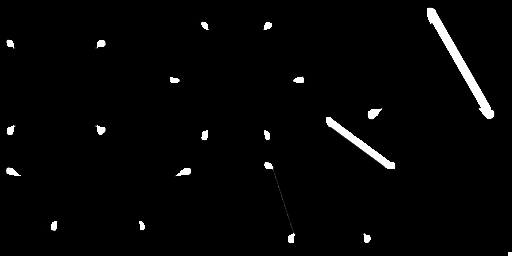

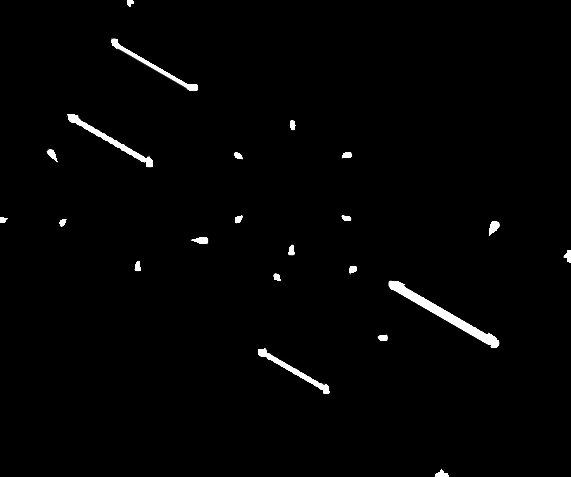

Puntos de interes


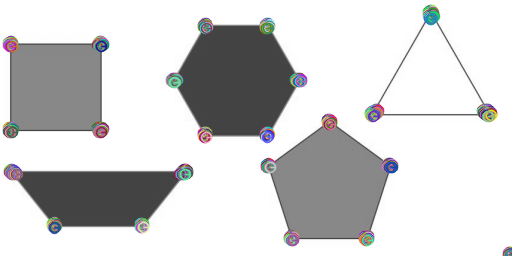

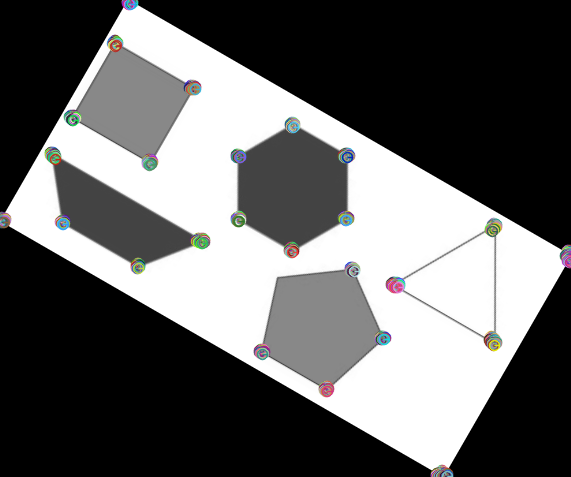

time: 1.24 s


In [49]:
generate_results('poligonos.png', 30, 3e4,method='harris')

Resultados de filtro de Harris


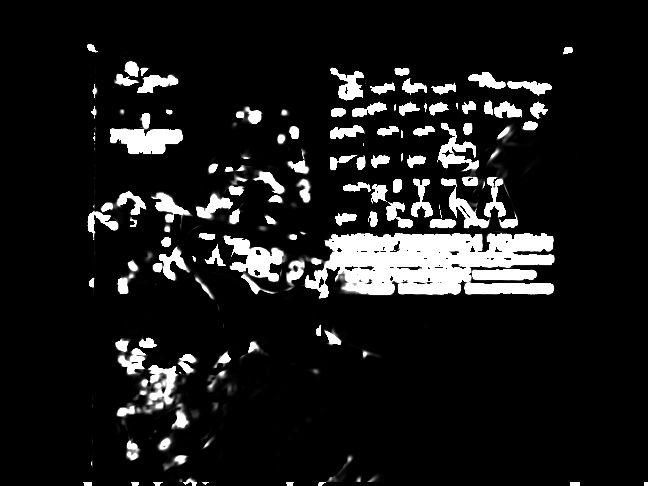

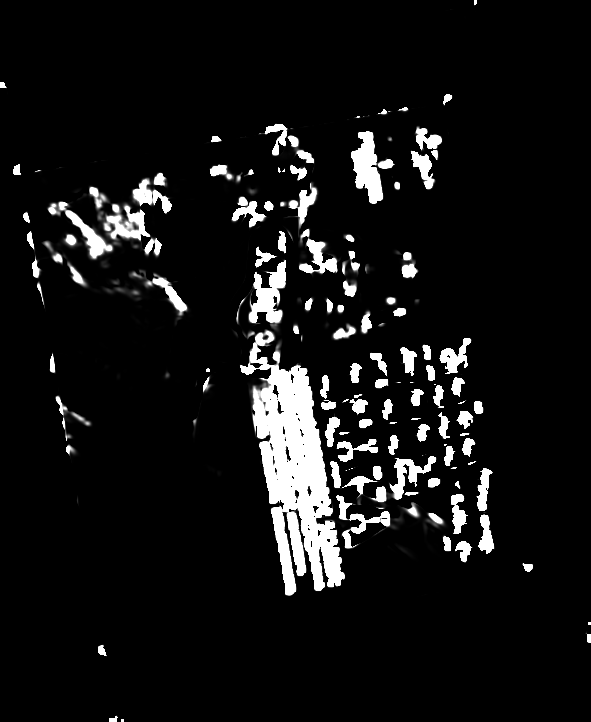

Puntos de interes


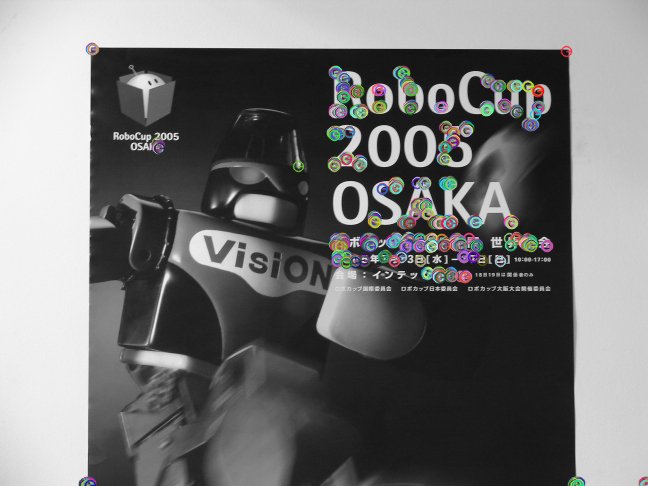

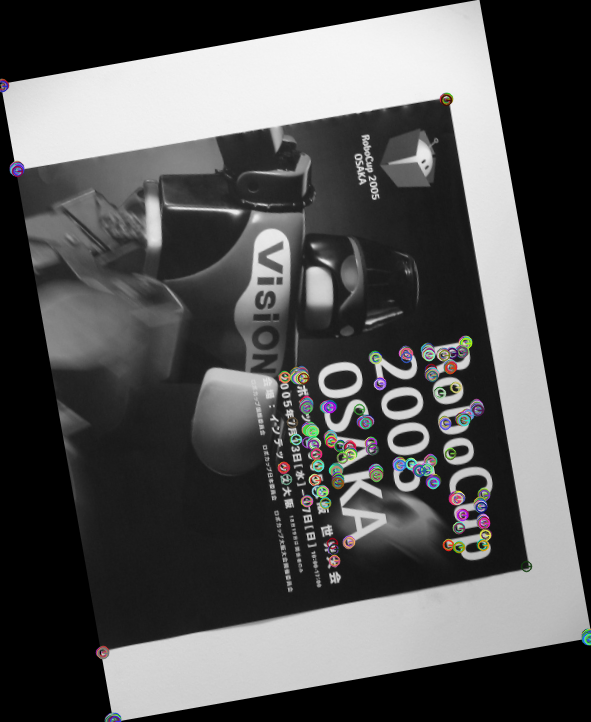

time: 2.44 s


In [55]:
generate_results('uch006a.jpg', 80, 3e5,method='harris')

Resultados de filtro de Harris


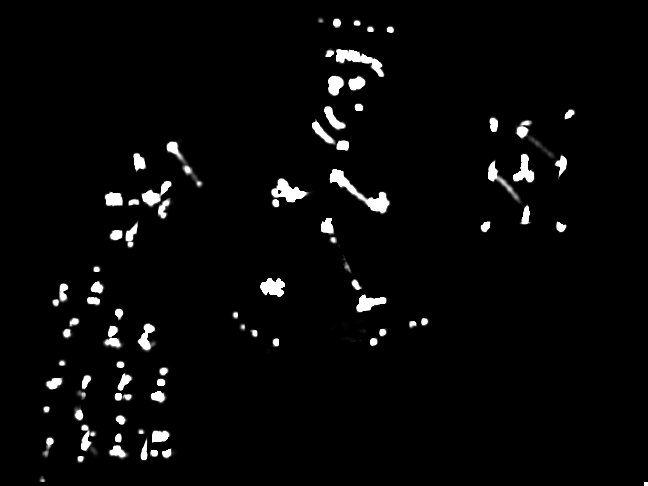

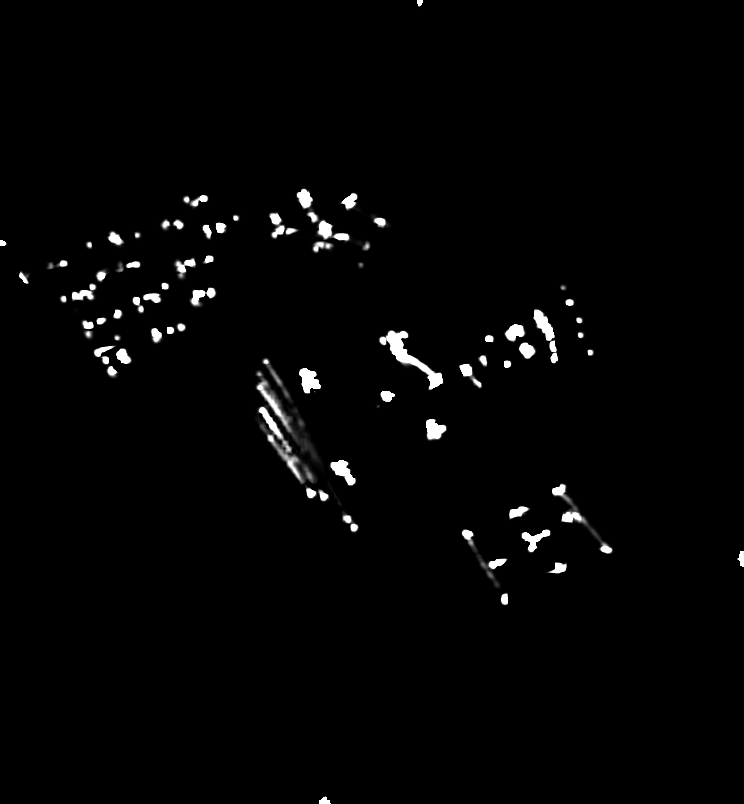

Puntos de interes


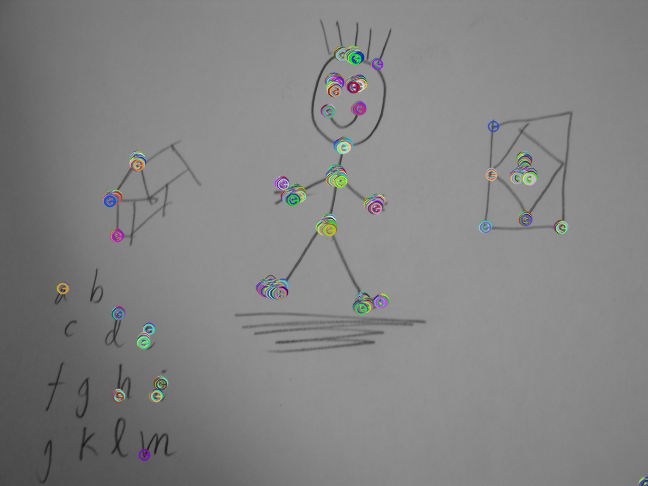

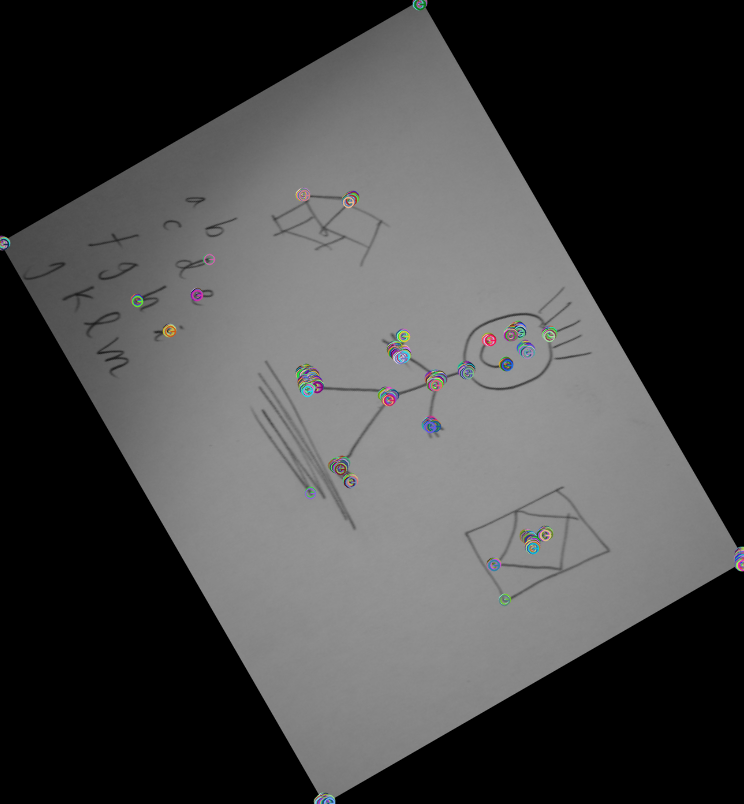

time: 2.96 s


In [57]:
generate_results('uch101b.jpg', 60, 3e3,method='harris')

De los resultados obtenidos utilizando el detector de Harris, se puede notar que es bastante robusto para la detección de esquinas, en particular, los resultados son prácticamente invariantes ante rotaciones en las imágenes, ya que se probó con diferentes ángulos en cada caso (30, 60 y 80) y se obtenian detecciones similares.


## Pruebas con el detector de Shi-tomasi

Resultados de filtro de Shi-tomasi


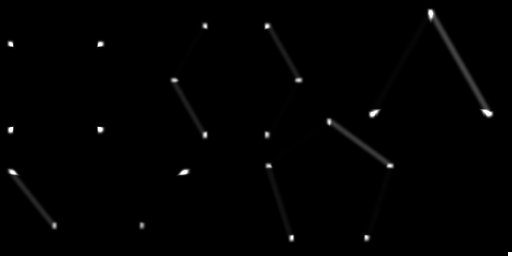

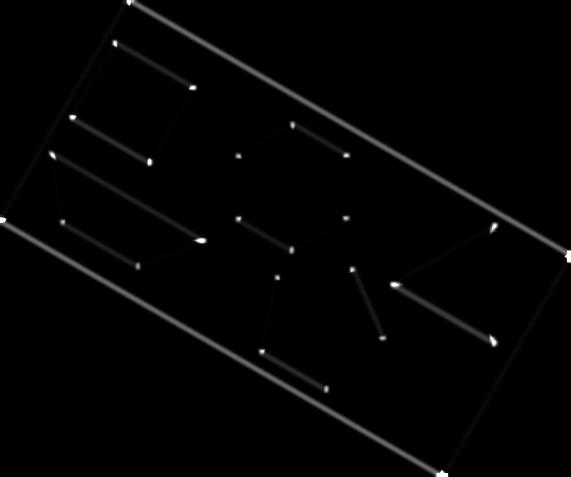

Puntos de interes filtro de Shi-tomasi


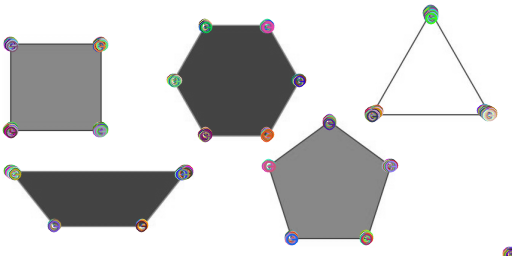

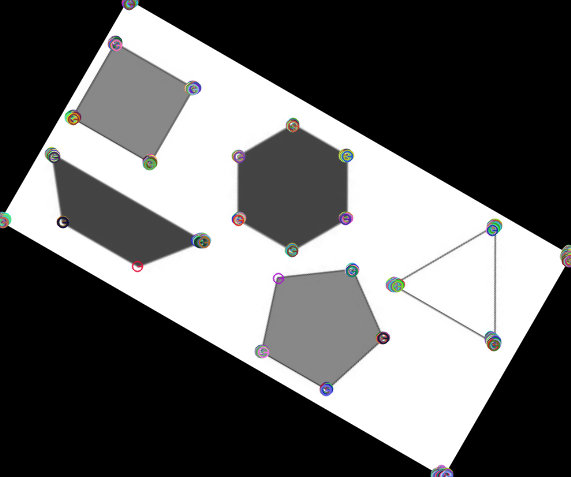

time: 2.38 s


In [92]:
generate_results('poligonos.png', 30, 1.5e2,method='shitomasi')

Resultados de filtro de Shi-tomasi


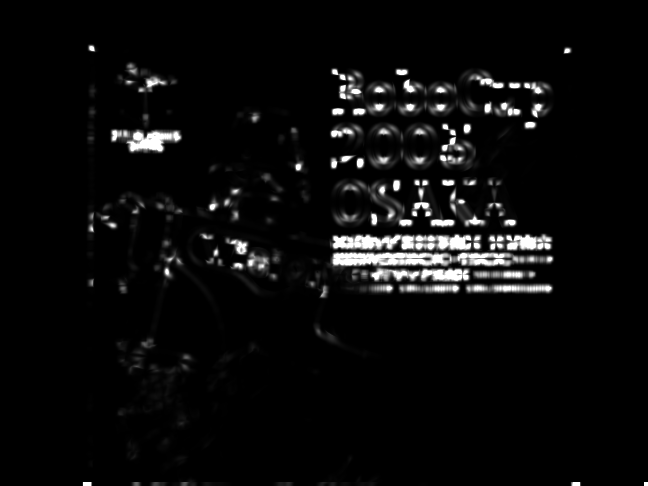

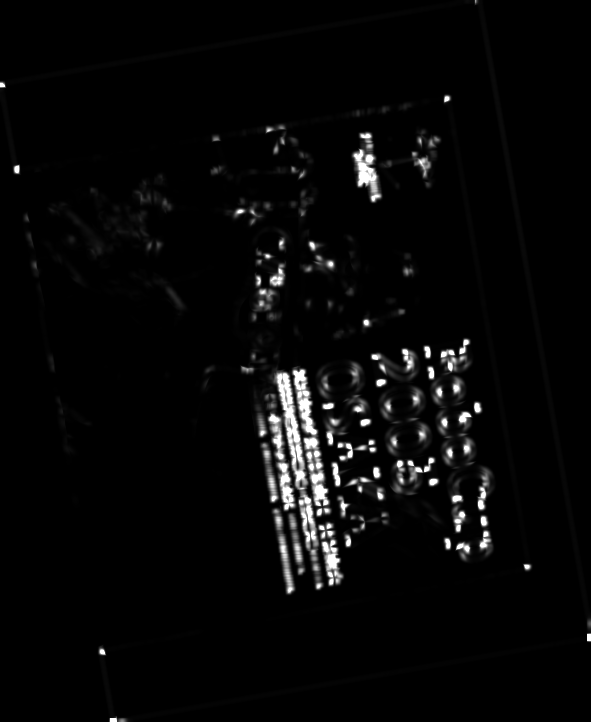

Puntos de interes filtro de Shi-tomasi


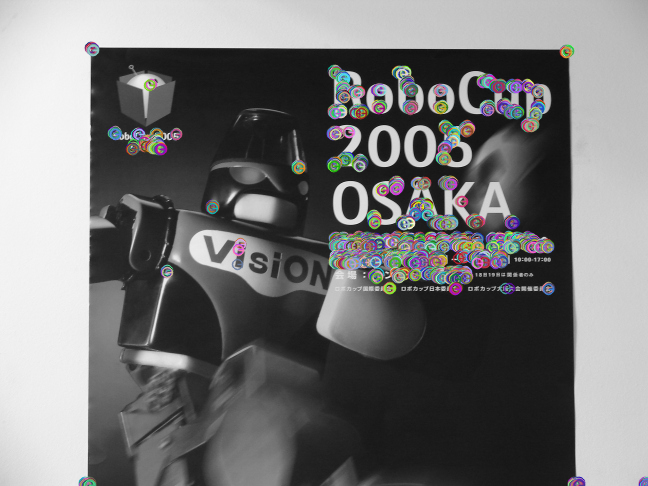

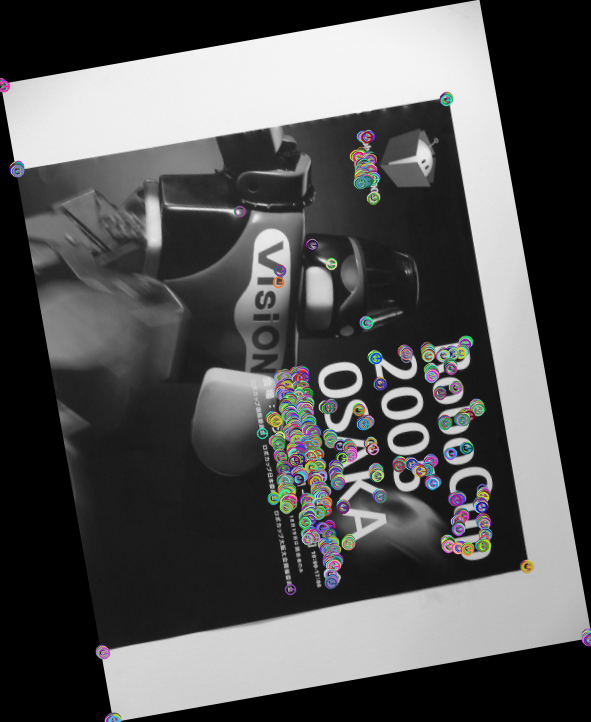

time: 4.55 s


In [93]:
generate_results('uch006a.jpg', 80, 3e2,method='shitomasi')

Resultados de filtro de Shi-tomasi


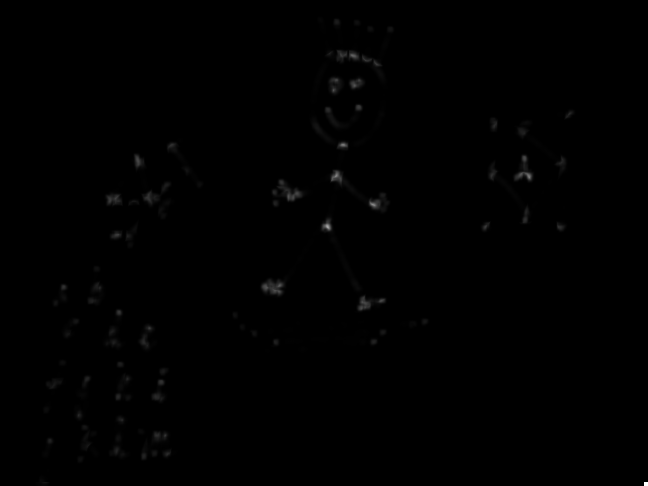

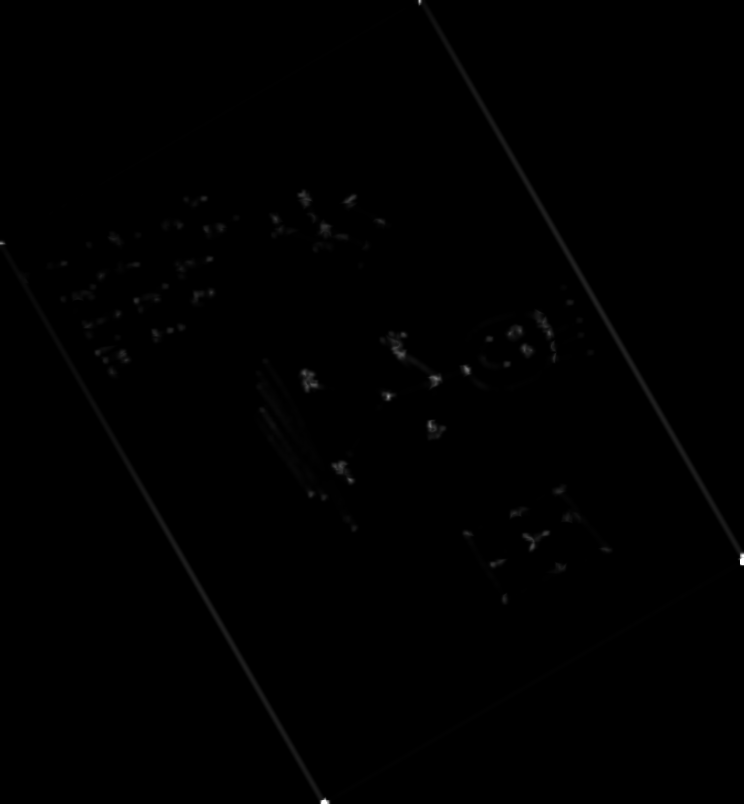

Puntos de interes filtro de Shi-tomasi


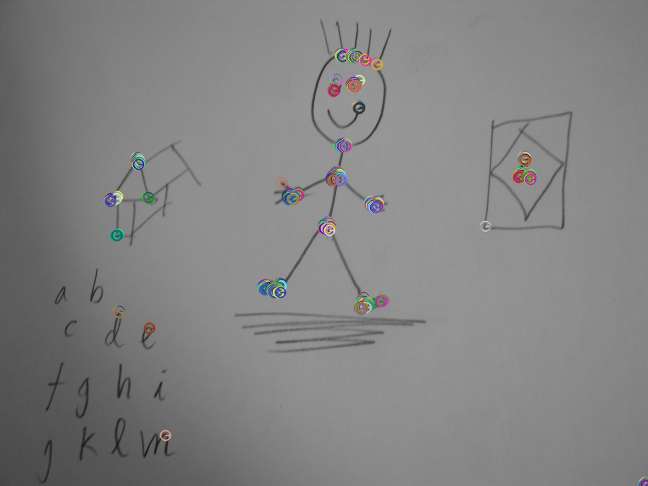

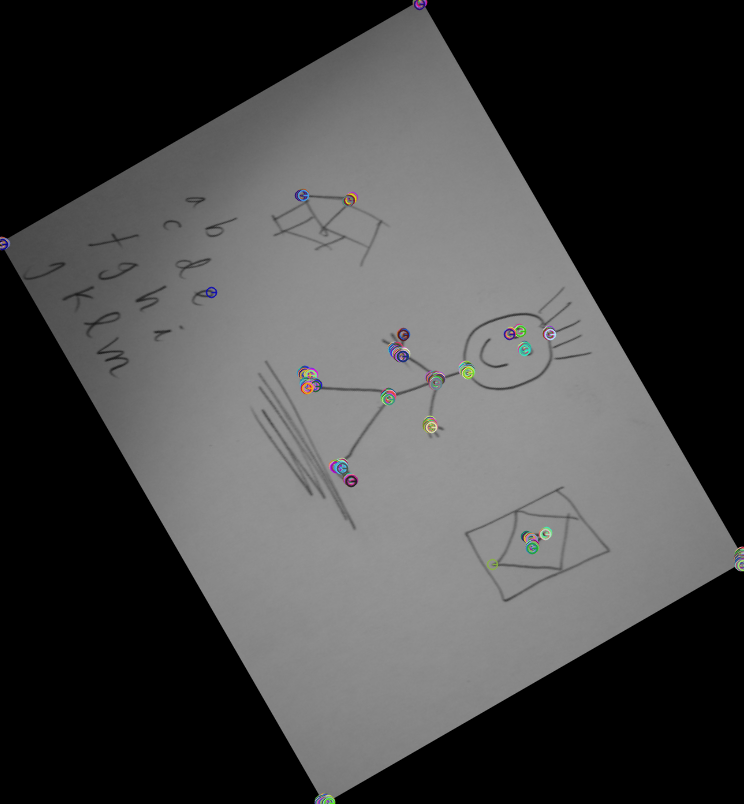

time: 5.49 s


In [94]:
generate_results('uch101b.jpg', 60, 5e1,method='shitomasi')

De los resultados obtenidos utilizando el detector de Shi-tomasi, nuevamente se puede notar que es bastante robusto ante rotaciones en las imágenes, ya que se probó con diferentes ángulos en cada caso (30, 60 y 80) y se obtuvieron detecciones similares.
Sin embargo, se notó que las detecciones en este caso son más debiles que en el detector de Harris, por lo que se necesitan thresholds más pequeños.



Una posible debilidad que se detecta en ambos métodos, es la dependencia del threshold para filtrar puntos en los resultados, puesto que para cada imagen fue necesario ocupar uno diferente. Esto finalmente puede ser un limitante para alguna aplicación de este sistema, ya que con un valor de threshold fijo, solo funcionaría en escenarios puntuales.

# **Alineamiento de imágenes**

In [5]:
# Esta funcion ya esta lista, no debe ser modificada
def filterMatches(matches, kp1, kp2):
  # Apply ratio test
  points1 = []
  points2 = []
  good = []

  for m,n in matches:
    if m.distance < 0.75*n.distance:  # 0.75
      good.append([m])
      points1.append(kp1[m.queryIdx].pt)
      points2.append(kp2[m.trainIdx].pt)
  return np.array(points1), np.array(points2), good

Se crea la función *alineamiento*, la cual toma 2 imágenes (parte izquierda y parte derecha), y aplica el algoritmo de alineamiento.

Para esto, en primer lugar se generan los puntos de interés de ambas imágenes mediante el detector cv2.SIFT_create. 

Luego se generan los matchings entre los puntos de interés encontrados utilizando el BFMatcher de opencv, el cual compara todos los  primera imagen con todos los puntos de la segunda para encontrar el más cercano.

Luego, se filtran los matchings mediante la función *filterMatches* entregada por el cuerpo docente, y con esto se obtienen los puntos para hacer el alineamiento.

Con los puntos encontrados en el paso anterior, se calcula la homografía mediante la función *findHomography* de opencv, la cual consiste en una matriz de transformación.

A partir de esta homografía, se transforma la perspectiva de la segunda imagen mediante la función *warpPerspective* de opencv.

Finalmente se fuciona la imagen original izquierda, con la imagen derecha previamente transformada.

In [6]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

def alineamiento(imgleft, imgright):
  img1 = cv2.imread(imgleft,0)
  img2 = cv2.imread(imgright,0)
  print('Imagen Izquierda')
  cv2_imshow(img1)
  print('Imagen Derecha')
  cv2_imshow(img2)
  detector = cv2.SIFT_create()

  (kp1, des1) = detector.detectAndCompute(img1,None)
  (kp2, des2) = detector.detectAndCompute(img2,None)

  # BFMatcher with default params
  bf = cv2.BFMatcher()
  matches = bf.knnMatch(des1,des2, k=2)

  points1, points2, good = filterMatches(matches, kp1, kp2)

  img_match = cv2.drawMatchesKnn(img1, kp1, img2, kp2,
                                  good, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  
  print('Puntos de matching entre las dos imágenes')
  cv2_imshow(img_match)

  # El objetivo del codigo que sigue es alinear dos imagenes

  # 1) Por hacer: calcular la homografia usando cv2.findHomography( ) con parametro cv2.RANSAC
  M, mask = cv2.findHomography(points2, points1, cv2.RANSAC)
  # 2) Por hacer: transformar la imagen img2 usando la funcion warpPerspective( ) y la homografia
  #   La imagen de salida debe tener un tamano suficiente
  #   Se recomienda que tenga el doble del ancho de la imagen de entrada
  transform = cv2.warpPerspective(img2, M,(img2.shape[1]*2,img2.shape[0]))
  # 3) Por hacer: copiar la imagen img1 a la imagen resultante del paso anterior (se obtiene la imagen fusionada)
  transform[:,:img2.shape[1]] = img1[:img2.shape[0],:img2.shape[1]]
  # 4) Por hacer: mostrar la imagen fusionada
  print('Imagen fusionada')
  cv2_imshow(transform)

Imagen Izquierda


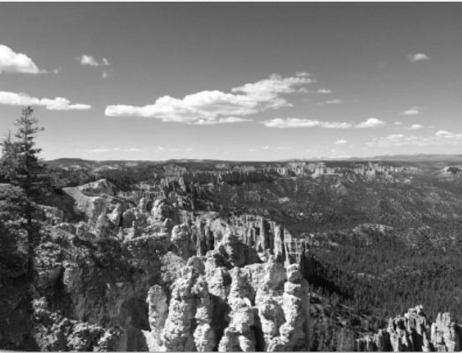

Imagen Derecha


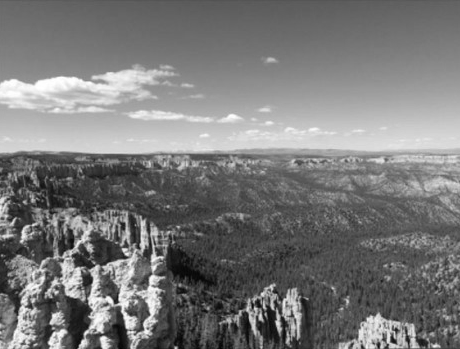

Puntos de matching entre las dos imágenes


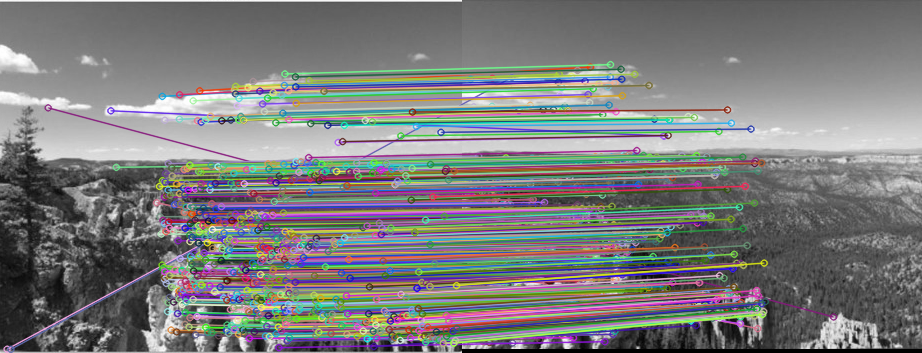

Imagen fusionada


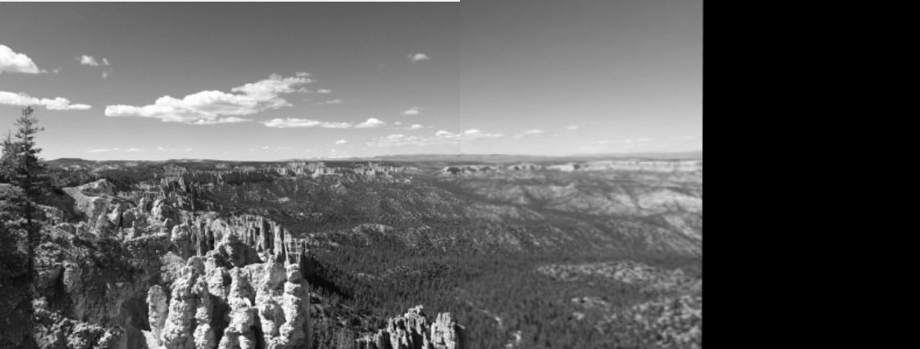

In [7]:
alineamiento('left1.png', 'right1.png')

Imagen Izquierda


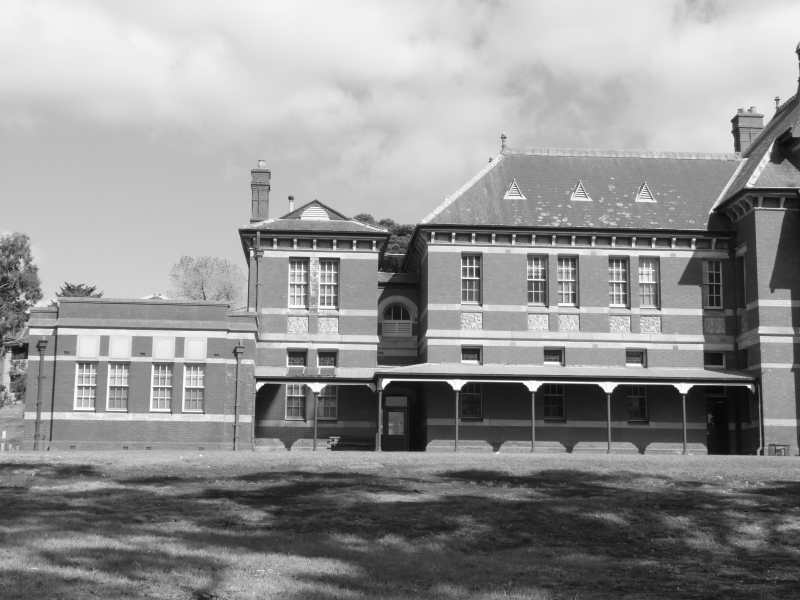

Imagen Derecha


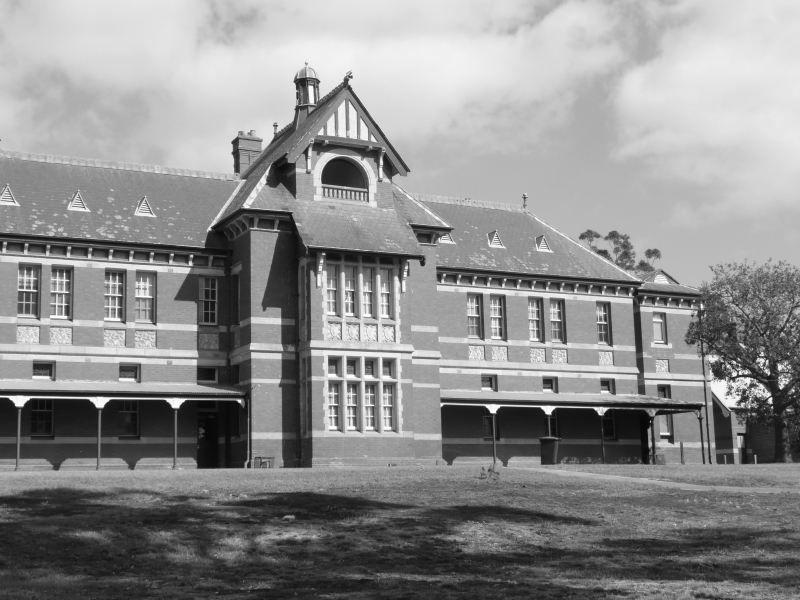

Puntos de matching entre las dos imágenes


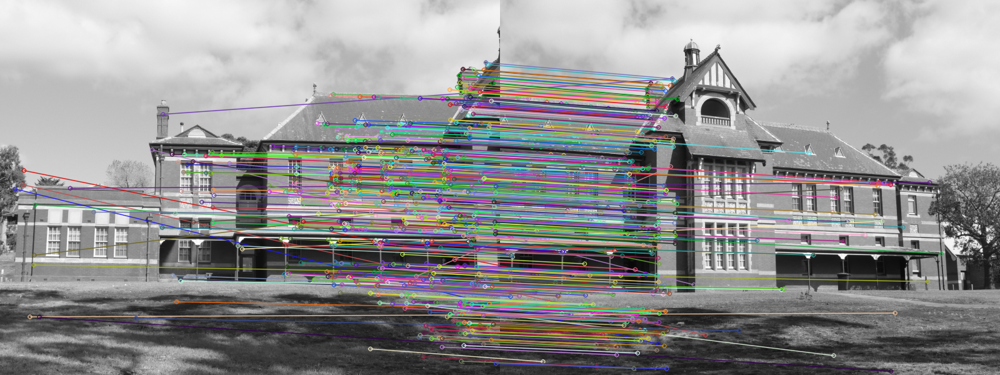

Imagen fusionada


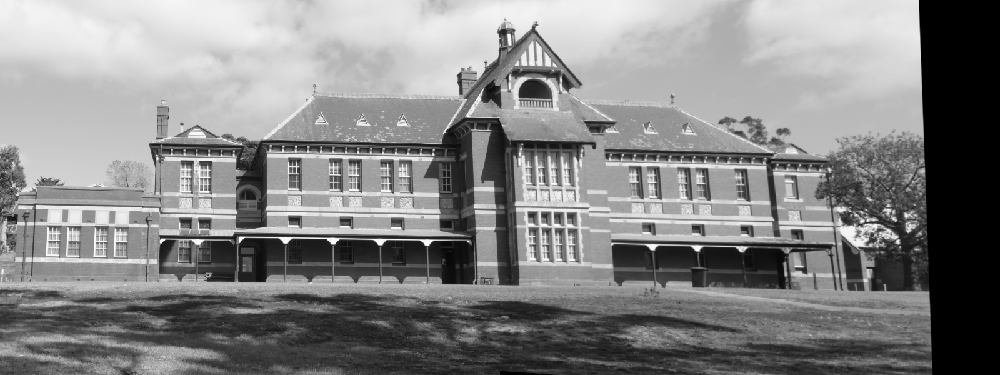

In [8]:
alineamiento('left2.jpg', 'right2.jpg')

Imagen Izquierda


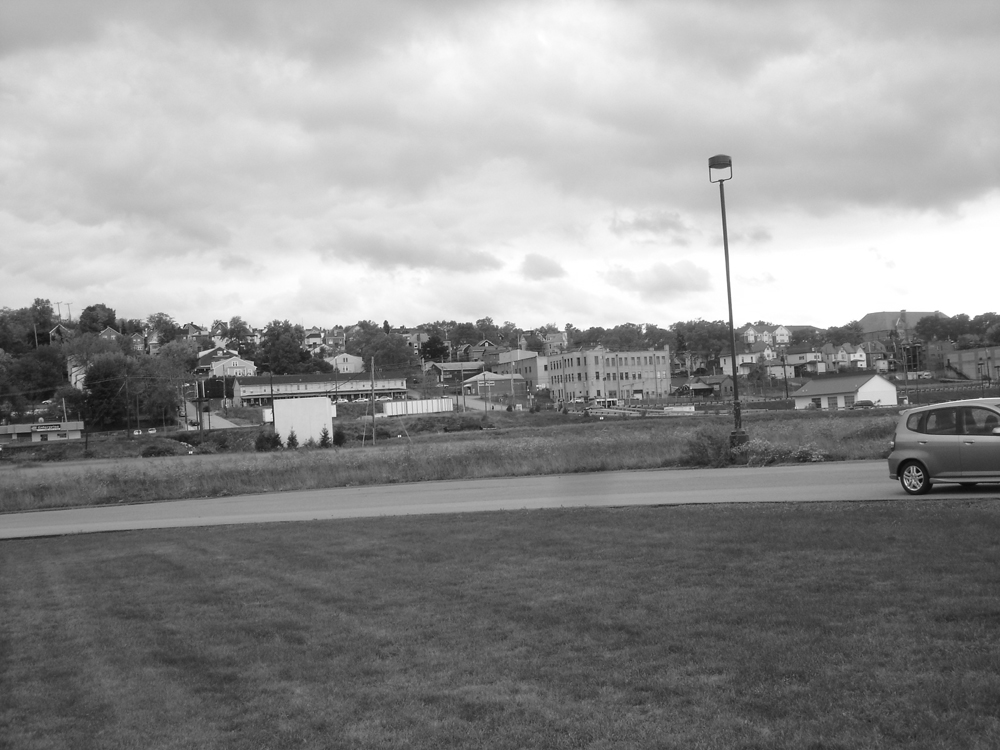

Imagen Derecha


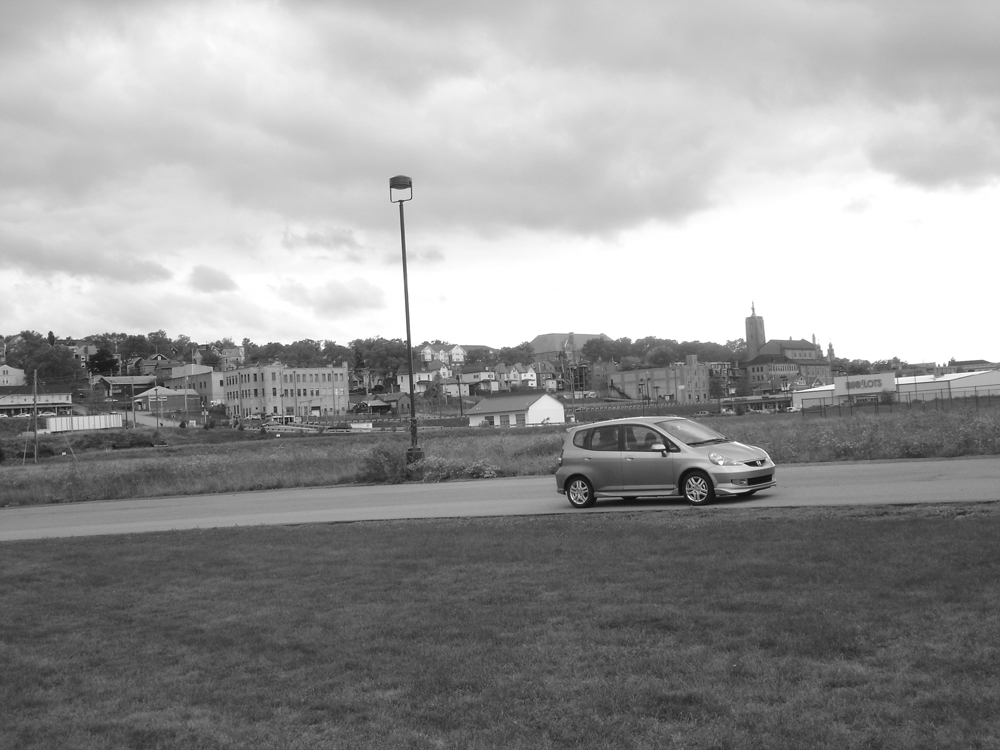

Puntos de matching entre las dos imágenes


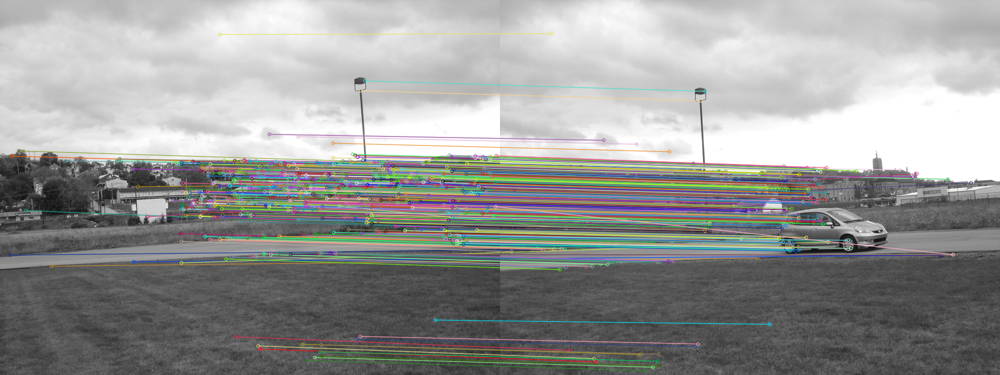

Imagen fusionada


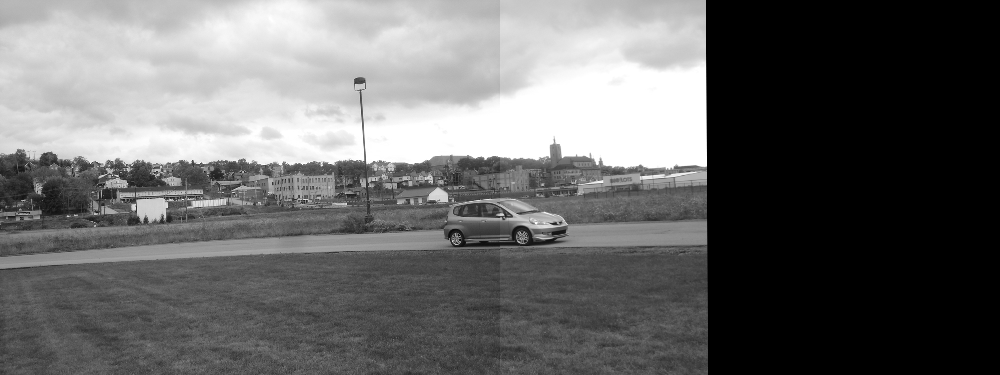

In [9]:
alineamiento('left3.jpg', 'right3.jpg')

Imagen Izquierda


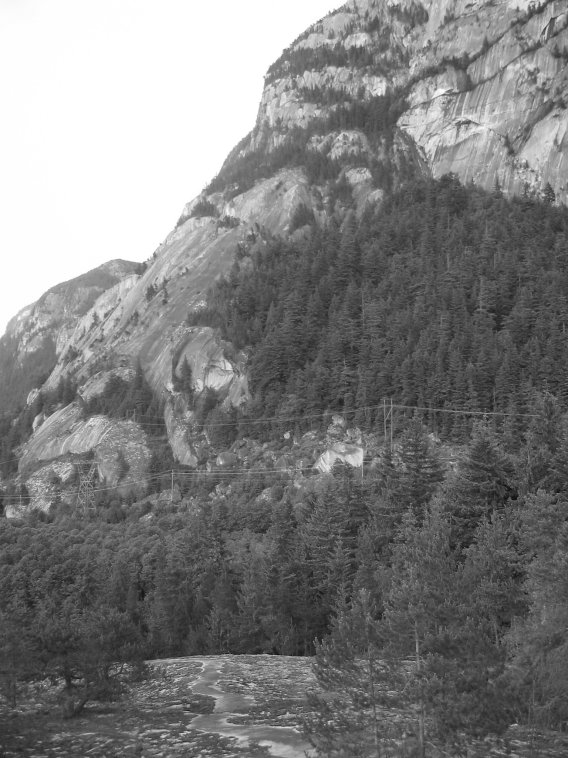

Imagen Derecha


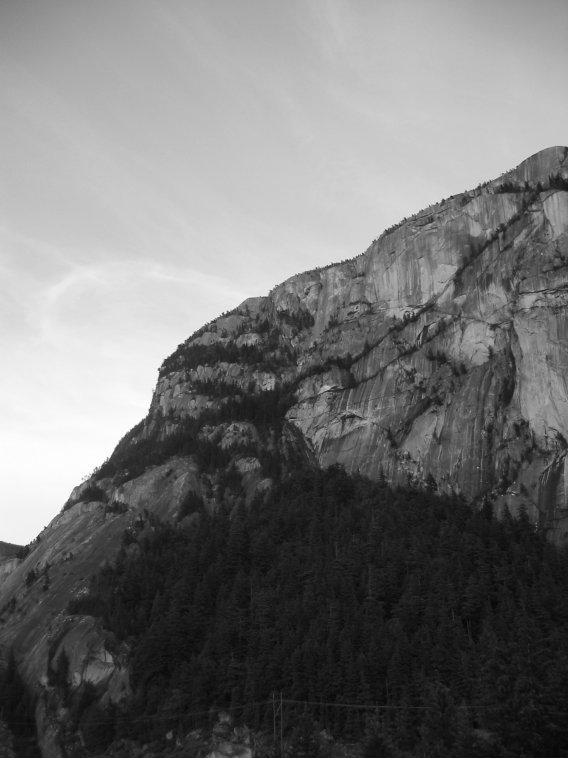

Puntos de matching entre las dos imágenes


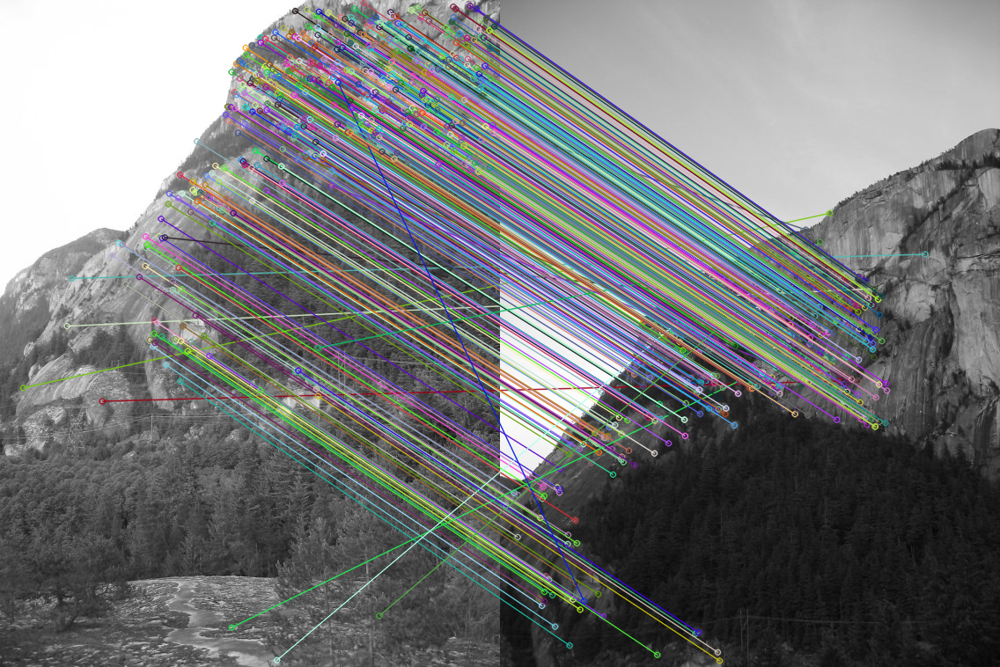

Imagen fusionada


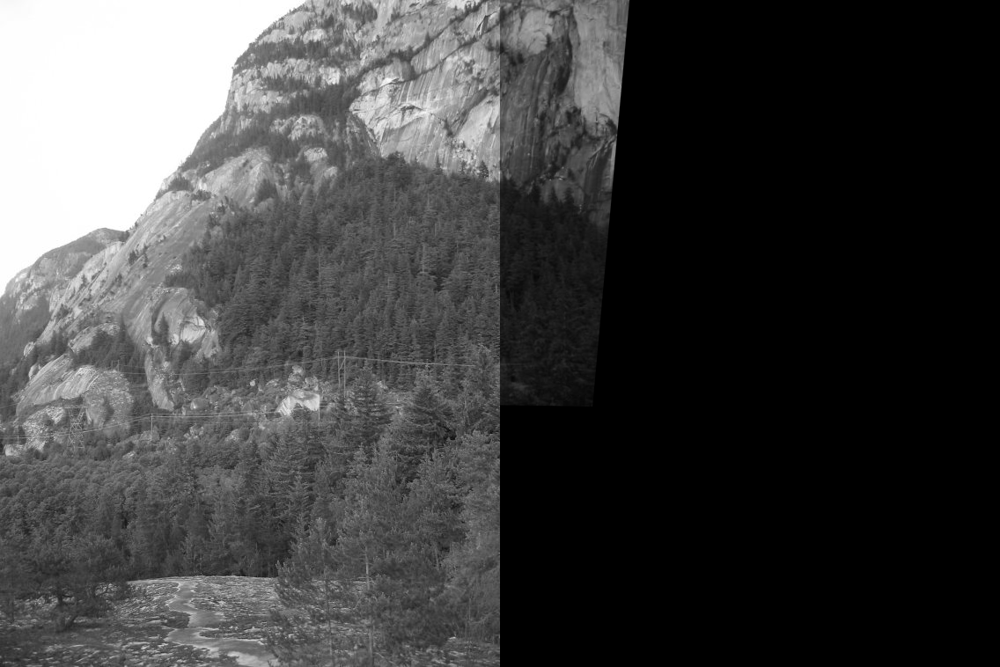

In [10]:
alineamiento('left4.jpg', 'right4.jpg')

En todos los casos de prueba de alineamiento de imágenes, se pueden observar buenos resultados, puesto que el sistema fue capaz de identificar la región de unión en las imágenes de entrada.
De lo anterior, se puede concluir que el sistema es bastante robusto, considerando que en el útlimo caso, las imágenes *izquierda* y *derecha* no estaban tan bien definidas, ya que más bien una imagen enfoca una parte más baja de la montaña. Aún así, es capaz de extraer la parte de la montaña faltante de la imagen derecha y agregarla a la imagen izquierda.

# **Conclusiones**

De los resultados obtenidos se puede concluir que se cumplió con los objetivos propuestos, ya que se implementaron tanto los detectores de puntos de interés, como el sistema de alineamiento de imágenes, ambos con resultados esperables.

En cuanto a los detectores, se puede decir que ambos son bastante robustos ante rotaciones, pero estan bastante limitados por el threshold, ya que diferentes imágenes necesitan diferente threshold.

Finalmente, se considera que los diferentes algoritmos implementados pueden ser de mucha utilidad en el futuro, puesto que en aplicaciones específicas, no es posible contar con sistemas actuales basados en Deep Learning, debido a sus limitantes (como la cantidad de datos para su entrenamiento o su gran costo computacional) o simplemente porque el problema no requiere el uso de un algoritmo tan complejo como lo son las redes neuronales profundas.